In [1]:
import numpy as np
import matplotlib.pyplot as plt
import mne
import os
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score

from mne import Epochs, pick_types, events_from_annotations
from mne.channels import make_standard_montage
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import eegbci
from mne.decoding import CSP
from mne.preprocessing import ICA, create_eog_epochs, create_ecg_epochs
from time import time
import pandas as pd

In [2]:
def power_spectral(fmin, fmax, n_fft, raw, info):
    raw.plot_psd(fmin = fmin, fmax = fmax, n_fft=n_fft) 
    plt.show()

for dirname, _, filenames in os.walk("D:\\Epilepsy\\Epilepsydataset"):
    for filename in filenames:
        print(os.path.join(dirname, filename))

D:\Epilepsy\Epilepsydataset\PN00-1.edf
D:\Epilepsy\Epilepsydataset\PN00-2.edf
D:\Epilepsy\Epilepsydataset\PN00-3.edf
D:\Epilepsy\Epilepsydataset\PN00-4.edf
D:\Epilepsy\Epilepsydataset\PN00-5.edf


In [3]:
raw = mne.io.read_raw_edf("D:\Epilepsy\Epilepsydataset\PN00-1.edf")
raw.load_data()
info = raw.info

print(info['sfreq'], 'Hz')
print(info['chs'][0])

Extracting EDF parameters from D:\Epilepsy\Epilepsydataset\PN00-1.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1343999  =      0.000 ...  2624.998 secs...
512.0 Hz
{'cal': 1.0, 'logno': 1, 'scanno': 1, 'range': 1.0, 'unit_mul': 0 (FIFF_UNITM_NONE), 'ch_name': 'EEG Fp1', 'unit': 107 (FIFF_UNIT_V), 'coord_frame': 4 (FIFFV_COORD_HEAD), 'coil_type': 1 (FIFFV_COIL_EEG), 'kind': 2 (FIFFV_EEG_CH), 'loc': array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan])}


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3381 samples (6.604 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Using matplotlib as 2D backend.


[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    2.3s finished


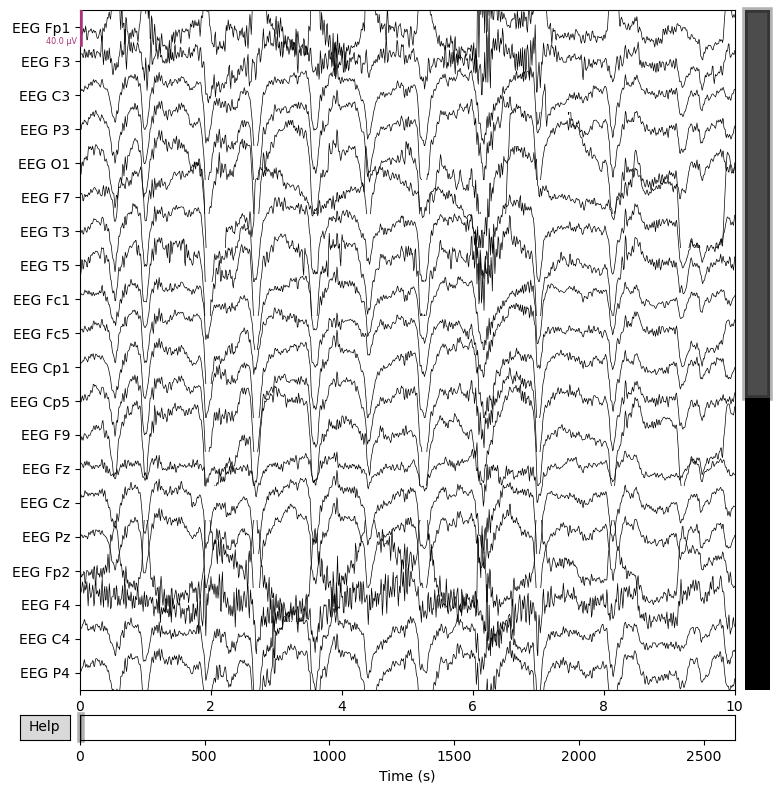

In [4]:
raw.filter(0.5,30)
raw.plot()
plt.show()

In [5]:
def run_ica(method, fit_params=None):
    ica = ICA(n_components=20, method=method, fit_params=fit_params,
              max_iter='auto', random_state=0)
    t0 = time()
    ica.fit(raw)
    fit_time = time() - t0
    title = ('ICA decomposition using %s (took %.1fs)' % (method, fit_time))
    ica.plot_components(title=title)

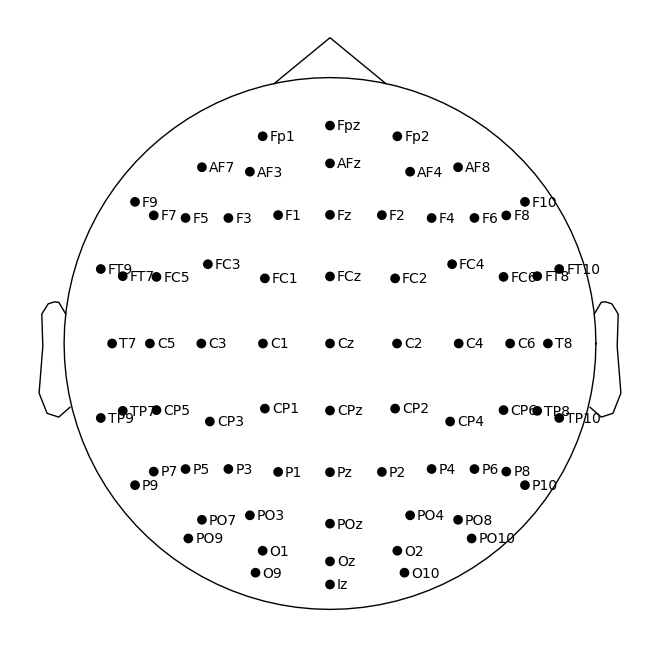

In [6]:
raw.set_channel_types({'2':'ecg','1': 'ecg' })


standard_1020_montage = mne.channels.make_standard_montage('easycap-M1')
standard_1020_montage.plot()
plt.show()

In [7]:
raw.rename_channels({'EEG Fp1':'Fp1', 'EEG F3':'F3', 'EEG C3':'C3', 'EEG P3':'P3', 'EEG O1':'O1', 
'EEG F7':'F7', 'EEG T3':'C1', 'EEG T5':'T7', 'EEG Fc1':'FC1', 'EEG Fc5':'FC5', 'EEG Cp1':'CP1', 
'EEG Cp5':'CP5', 'EEG F9':'F9', 'EEG Fz':'Fz', 'EEG Cz':'Cz', 'EEG Pz':'Pz', 'EEG Fp2':'Fp2', 
'EEG F4':'F4', 'EEG C4':'C4', 'EEG P4':'P4', 'EEG O2':'O2', 'EEG F8':'F8', 'EEG T4':'C2', 
'EEG T6':'T8', 'EEG Fc2':'FC2', 'EEG Fc6':'FC6', 'EEG Cp2':'CP2', 'EEG Cp6':'CP6', 
'EEG F10':'F10', 'EKG EKG':'AF7', 'SPO2':'Iz', 'HR':'AF8', 'MK':'Fpz'})

<RawEDF | PN00-1.edf, 35 x 1344000 (2625.0 s), ~358.9 MB, data loaded>

In [8]:
raw.set_montage(standard_1020_montage)

<RawEDF | PN00-1.edf, 35 x 1344000 (2625.0 s), ~358.9 MB, data loaded>

In [9]:
events = mne.find_events(raw, stim_channel = '2')
print (events)

[]


In [10]:
filt_raw = raw.copy().filter(l_freq=1., h_freq=None)
# filt_raw = raw.copy()

ica = ICA(n_components=25, max_iter='auto',method = 'fastica', random_state=97)
print ("ICA function")
ica.fit(filt_raw)
ica
print ("ICA Done")

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


ICA function
Fitting ICA to data using 33 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    3.1s finished


Selecting by number: 25 components
Fitting ICA took 96.2s.
ICA Done


Creating RawArray with float64 data, n_channels=27, n_times=1344000
    Range : 0 ... 1343999 =      0.000 ...  2624.998 secs
Ready.


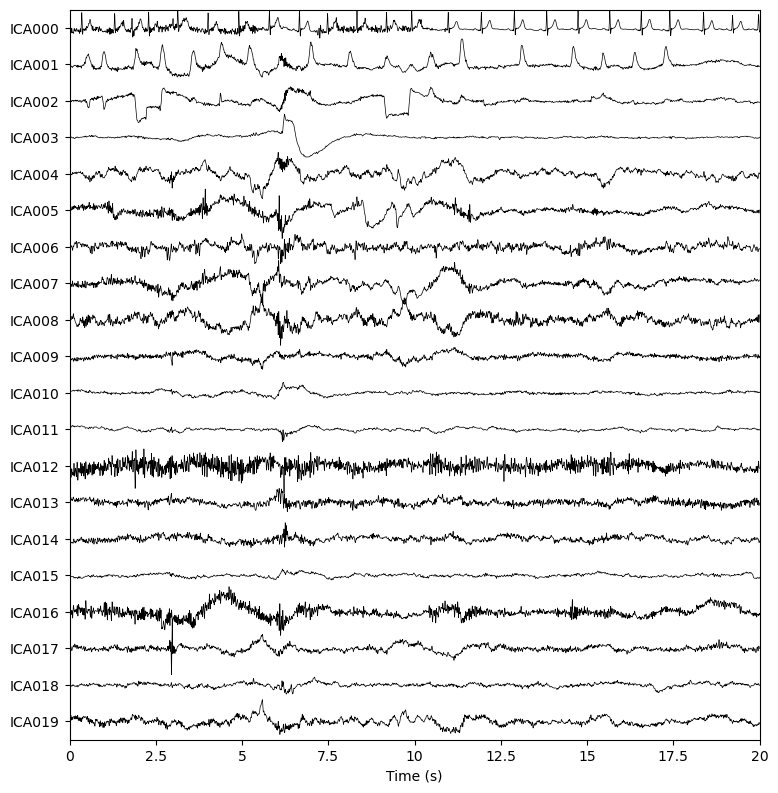

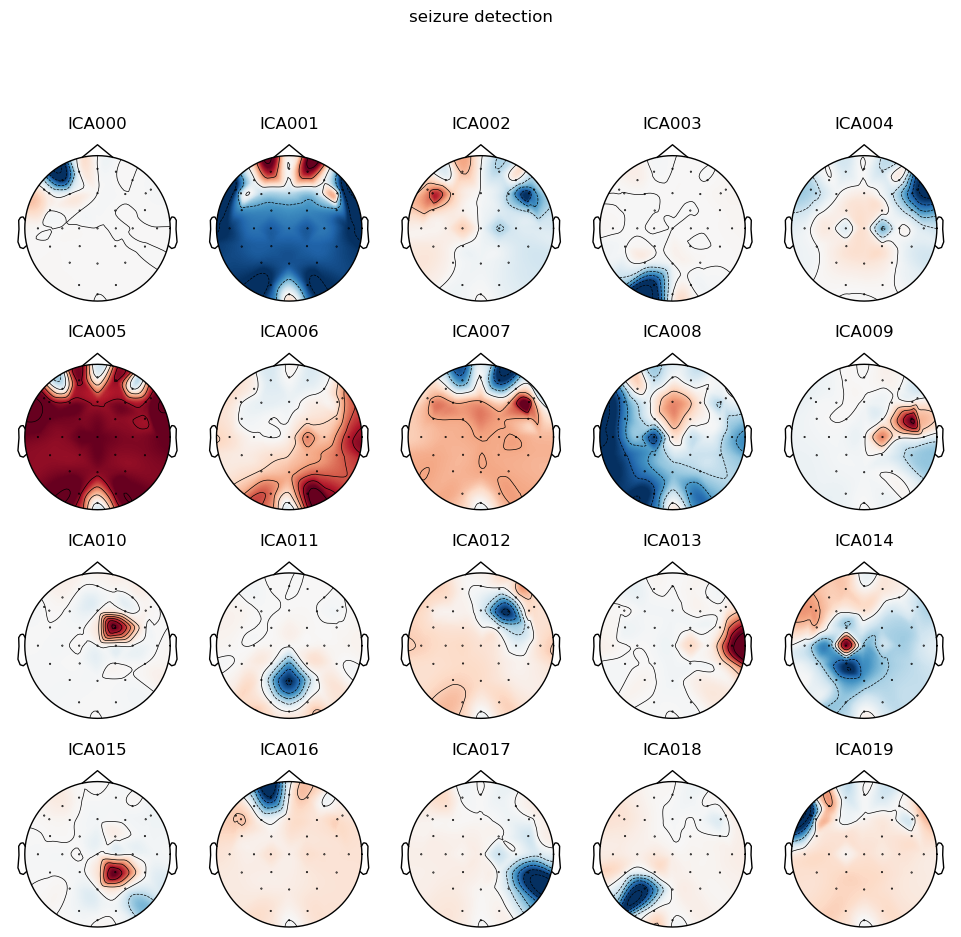

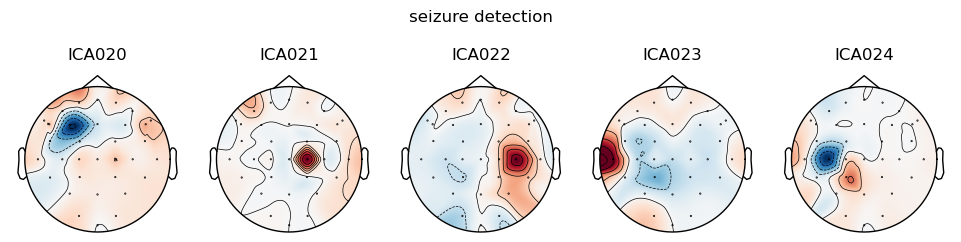

Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 0 ICA components
    Projecting back using 33 PCA components


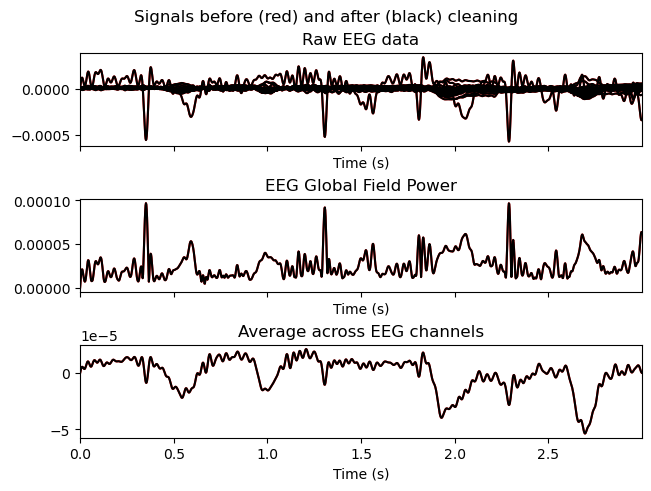

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1312 matching events found
No baseline correction applied
0 projection items activated


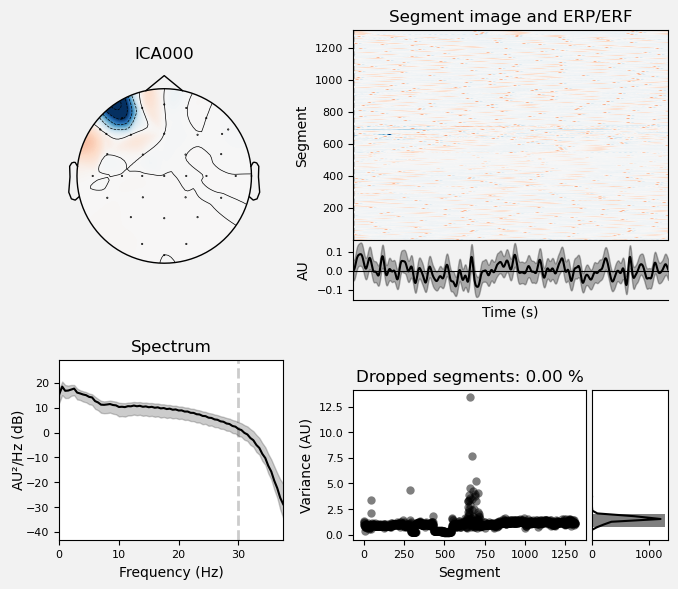

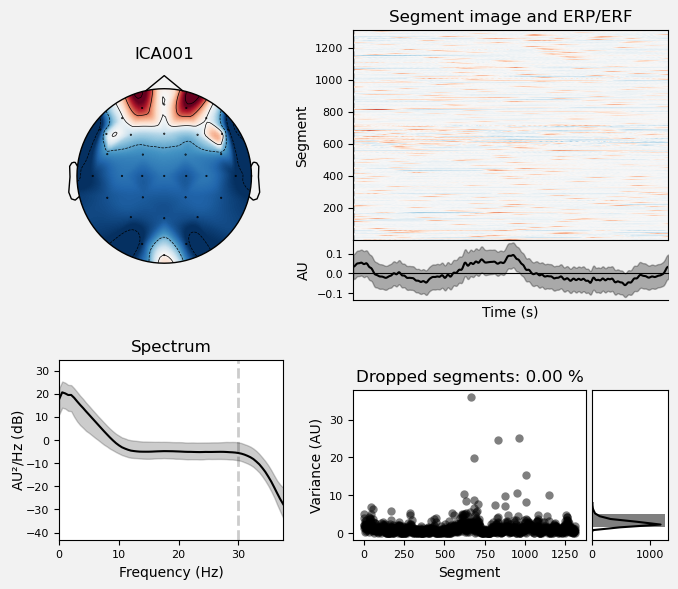

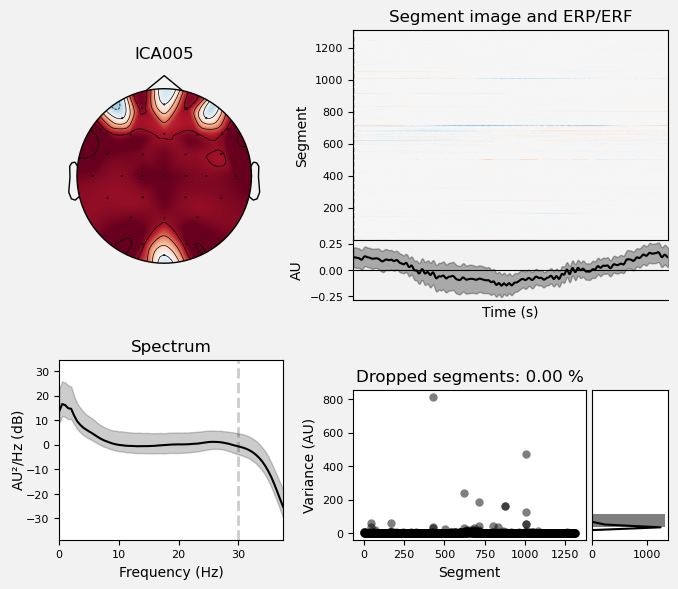

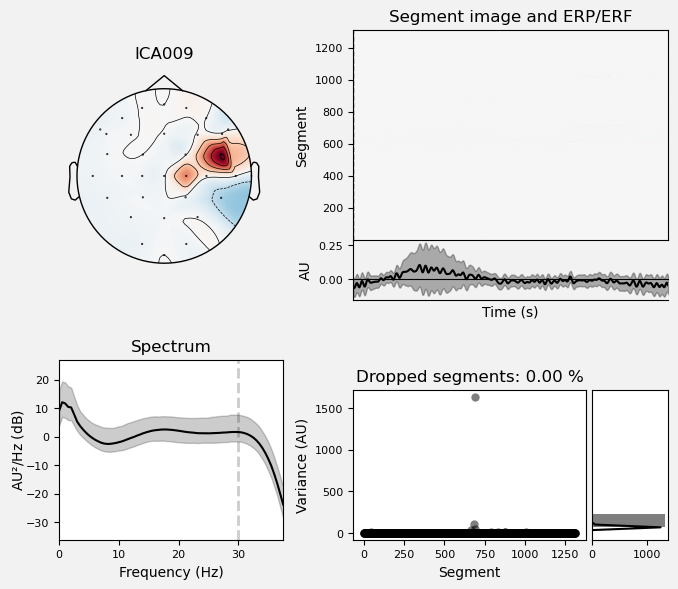

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [11]:
raw.load_data()
ica.plot_sources(raw, show_scrollbars=False)
ica.plot_components(title="seizure detection")

# blinks
ica.plot_overlay(raw, picks='eeg')

ica.plot_properties(raw, picks=[0,1,5,9])

In [12]:
reconst_raw = raw.copy()
raw.load_data()
ica.apply(reconst_raw, n_pca_components =15, )

Applying ICA to Raw instance
    Transforming to ICA space (25 components)
    Zeroing out 0 ICA components
    Projecting back using 25 PCA components


<RawEDF | PN00-1.edf, 35 x 1344000 (2625.0 s), ~358.9 MB, data loaded>

In [13]:
df = reconst_raw.to_data_frame()
print(df.head())
print(df.describe())

       time       Fp1        F3        C3        P3         O1        F7  \
0  0.000000 -0.000008  0.000052  0.000084  0.000021  -0.000003 -0.000039   
1  0.001953 -1.684509  1.949637  1.708186 -0.463298  -3.735232  0.328152   
2  0.003906 -3.217647  3.760677  3.307700 -0.908889  -7.270108  0.625947   
3  0.005859 -4.467752  5.310955  4.700745 -1.317079 -10.414713  0.869064   
4  0.007812 -5.342111  6.513535  5.810356 -1.663547 -13.002604  1.044042   

         C1         T7       FC1  ...       FC6       CP2       CP6       F10  \
0 -0.000020   0.000062 -0.000343  ...  0.000014  0.000019  0.000091 -0.000020   
1 -0.595845  -3.433199  1.820481  ...  0.158663  0.578708  1.004108  1.430733   
2 -1.184213  -6.661028  3.541707  ...  0.295436  1.136047  1.939114  2.785758   
3 -1.752658  -9.486288  5.071785  ...  0.394506  1.652139  2.744144  3.998972   
4 -2.284003 -11.734060  6.337529  ...  0.450520  2.111690  3.376494  5.024224   

            AF7   Iz  AF8             1             2   

In [14]:
# Check the shape of the datab
print(df.shape)

(1344000, 36)


In [15]:
df_summary=pd.read_csv(r"C:\Users\Bhanu Srinija\Downloads\subject_info.csv")

In [16]:
df_summary

,patient_id,age_years,gender,seizure,localization,lateralization,eeg_channel,number_seizures,rec_time_minutes
0,PN00,55,Male,IAS,T,R,29,5,198
1,PN01,46,Male,IAS,T,L,29,2,809
2,PN03,54,Male,IAS,T,R,29,2,752
3,PN05,51,Female,IAS,T,L,29,3,359
4,PN06,36,Male,IAS,T,L,29,5,722
5,PN07,20,Female,IAS,T,L,29,1,523
6,PN09,27,Female,IAS,T,L,29,3,410
7,PN10,25,Male,FBTC,F,Bilateral,20,10,1002
8,PN11,58,Female,IAS,T,R,29,1,145
9,PN12,71,Male,IAS,T,L,29,4,246


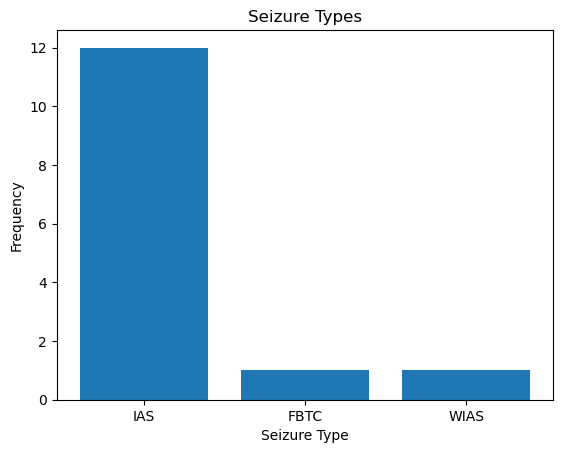

In [17]:
seizure_types = df_summary[' seizure'].value_counts()

plt.bar(seizure_types.index, seizure_types.values)
plt.title('Seizure Types')
plt.xlabel('Seizure Type')
plt.ylabel('Frequency')
plt.show()

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import imblearn

In [19]:
data = pd.read_csv("C:\\Users\\Bhanu Srinija\\Epilepsy detection\\Epilepsydataset\\Epileptic Seizure Recognition.csv")
data.head()

,Unnamed,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,X21.V1.791,135,190,229,223,192,125,55,-9,-33,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,4
1,X15.V1.924,386,382,356,331,320,315,307,272,244,...,164,150,146,152,157,156,154,143,129,1
2,X8.V1.1,-32,-39,-47,-37,-32,-36,-57,-73,-85,...,57,64,48,19,-12,-30,-35,-35,-36,5
3,X16.V1.60,-105,-101,-96,-92,-89,-95,-102,-100,-87,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,5
4,X20.V1.54,-9,-65,-98,-102,-78,-48,-16,0,-21,...,4,2,-12,-32,-41,-65,-83,-89,-73,5


In [20]:
data.isnull().sum()

Unnamed    0
X1         0
X2         0
X3         0
X4         0
          ..
X175       0
X176       0
X177       0
X178       0
y          0
Length: 180, dtype: int64

In [21]:
data.shape

(11500, 180)

In [22]:
data['y'].value_counts()

y
4    2300
1    2300
5    2300
2    2300
3    2300
Name: count, dtype: int64

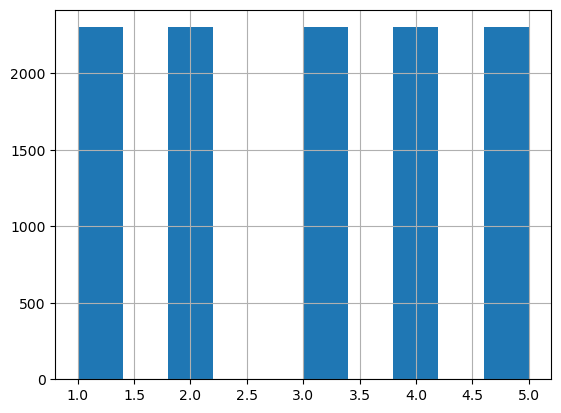

In [23]:
data.y.hist()
plt.show()


In [24]:
dic = {5: 0, 4: 0, 3: 0, 2: 0, 1: 1}
data['y'] = data['y'].map(dic)

In [25]:
print(data['y'].value_counts())

data.head()

y
0    9200
1    2300
Name: count, dtype: int64


,Unnamed,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,X21.V1.791,135,190,229,223,192,125,55,-9,-33,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,0
1,X15.V1.924,386,382,356,331,320,315,307,272,244,...,164,150,146,152,157,156,154,143,129,1
2,X8.V1.1,-32,-39,-47,-37,-32,-36,-57,-73,-85,...,57,64,48,19,-12,-30,-35,-35,-36,0
3,X16.V1.60,-105,-101,-96,-92,-89,-95,-102,-100,-87,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,0
4,X20.V1.54,-9,-65,-98,-102,-78,-48,-16,0,-21,...,4,2,-12,-32,-41,-65,-83,-89,-73,0


In [26]:
data = data.drop('Unnamed', axis = 1)

In [27]:
X = data.drop('y', axis=1)
y = data['y']
#df= pd.DataFrame(normalize(X))

In [28]:
detected_outliers = 0
managed_outliers = 0

for col in df.columns[:-1]:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = (df[col] < lower_bound) | (df[col] > upper_bound)
    if outliers.any():
        detected_outliers += outliers.sum()

        
        df.loc[outliers, col] = np.nanmedian(df[col])
        managed_outliers += outliers.sum()

print(f"Detected {detected_outliers} outliers and managed {managed_outliers} outliers.")


Detected 4984257 outliers and managed 4984257 outliers.


In [29]:
df['y'] = y

print('Normalized Totall Mean VALUE for Epiletic: {}'.format((df[df['y'] == 1].describe().mean()).mean()))
print('Normalized Totall Std VALUE for Epiletic: {}'.format((df[df['y'] == 1].describe().std()).std()))

print('Normalized Totall Mean VALUE for NOT Epiletic: {}'.format((df[df['y'] == 0].describe().mean()).mean()))
print('Normalized Totall Std VALUE for NOT Epiletic: {}'.format((df[df['y'] == 0].describe().std()).std()))

Normalized Totall Mean VALUE for Epiletic: 289.4436197261153
Normalized Totall Std VALUE for Epiletic: 8.328523102293534
Normalized Totall Mean VALUE for NOT Epiletic: 1151.9635711421406
Normalized Totall Std VALUE for NOT Epiletic: 6.320305646097946


In [30]:
df.shape

(1344000, 37)

In [31]:
oversample = imblearn.over_sampling.RandomOverSampler(sampling_strategy='minority')

X, y = oversample.fit_resample(data.drop('y', axis=1), data['y'])

X.shape, y.shape

((18400, 178), (18400,))

In [32]:
data.corr()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
X1,1.000000,0.947729,0.808192,0.608109,0.393674,0.218226,0.103693,0.044483,0.027923,0.032221,...,0.027263,0.045401,0.051630,0.049604,0.042967,0.036144,0.030581,0.024562,0.020022,-0.031262
X2,0.947729,1.000000,0.944623,0.790403,0.576579,0.369803,0.211793,0.109478,0.060218,0.043565,...,0.012602,0.025937,0.031606,0.030452,0.025975,0.024290,0.023906,0.021962,0.018059,-0.024503
X3,0.808192,0.944623,1.000000,0.939522,0.778648,0.573874,0.382493,0.231084,0.133249,0.080003,...,0.004575,0.011752,0.016424,0.017070,0.014837,0.015536,0.016982,0.017070,0.012419,-0.015615
X4,0.608109,0.790403,0.939522,1.000000,0.938636,0.784954,0.590497,0.399855,0.250052,0.150284,...,-0.001028,0.000632,0.006617,0.011882,0.014496,0.016992,0.016911,0.014671,0.006226,-0.002149
X5,0.393674,0.576579,0.778648,0.938636,1.000000,0.941267,0.792304,0.596424,0.410651,0.265112,...,0.004861,0.000918,0.006488,0.013946,0.019146,0.021924,0.018869,0.013607,0.001298,0.013362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
X175,0.036144,0.024290,0.015536,0.016992,0.021924,0.022444,0.014869,-0.000510,-0.018552,-0.036517,...,0.195640,0.366428,0.573335,0.782018,0.936986,1.000000,0.933893,0.759069,0.533265,-0.038926
X176,0.030581,0.023906,0.016982,0.016911,0.018869,0.020977,0.017016,0.005851,-0.009052,-0.025522,...,0.084966,0.195891,0.359400,0.563321,0.767300,0.933893,1.000000,0.931826,0.759381,-0.037875
X177,0.024562,0.021962,0.017070,0.014671,0.013607,0.017383,0.018572,0.012590,0.001943,-0.011809,...,0.022042,0.071946,0.175322,0.337020,0.537493,0.759069,0.931826,1.000000,0.934330,-0.037212
X178,0.020022,0.018059,0.012419,0.006226,0.001298,0.004240,0.008325,0.008032,0.004823,-0.001332,...,-0.004094,0.001945,0.049854,0.155044,0.315385,0.533265,0.759381,0.934330,1.000000,-0.035855


In [33]:
fig, ax = plt.subplots(figsize=(25, 25))
sns.heatmap(data.corr(), annot=True, ax=ax)

<Axes: >

In [34]:
print('Number of records of Non Epileptic {0} VS Epilepttic {1}'.format(len(y == True), len(y == False)))

Number of records of Non Epileptic 18400 VS Epilepttic 18400


In [35]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

he = X_train, X_test, y_train, y_test
[arr.shape for arr in he]

[(14720, 178), (3680, 178), (14720,), (3680,)]

In [37]:
X_test = np.array(X_test)
models = [
    ('SVM', SVC()),
    ('Random Forest', RandomForestClassifier()),
    ('XGBoost', XGBClassifier()),
    ('K-Nearest Neighbors', KNeighborsClassifier())
]

accuracy_lst = []

for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_lst.append((name, accuracy * 100))
print(accuracy_lst)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


[('SVM', 97.01086956521739), ('Random Forest', 98.83152173913044), ('XGBoost', 99.04891304347827), ('K-Nearest Neighbors', 96.22282608695653)]


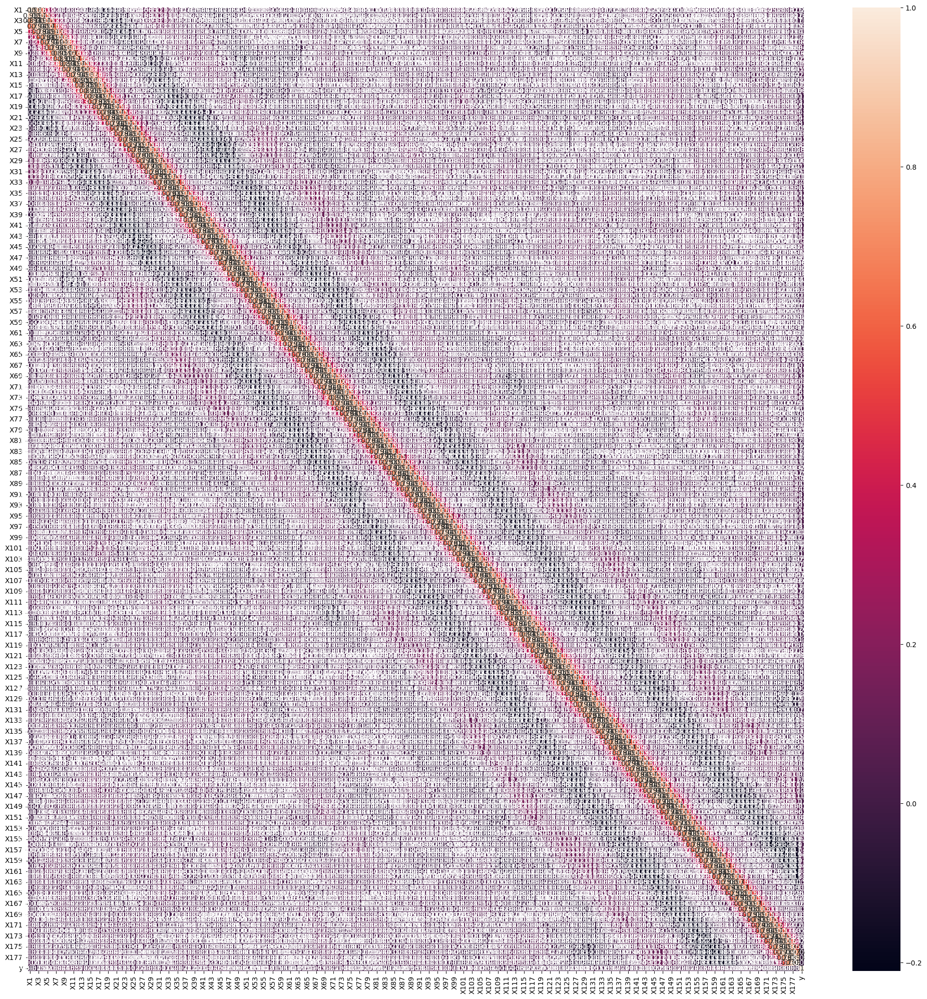

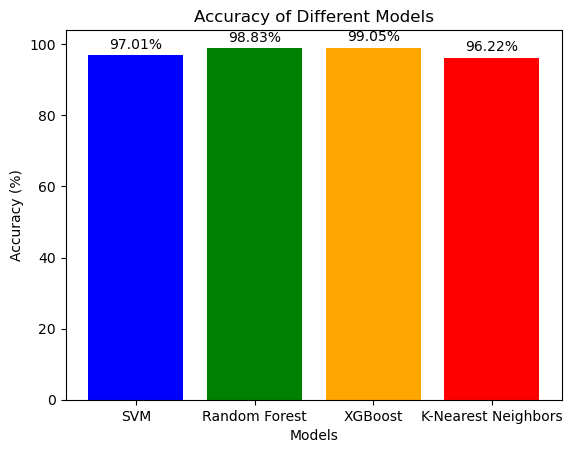

In [38]:
fig, ax = plt.subplots()
names, accuracies = zip(*accuracy_lst)
bars = ax.bar(names, accuracies, color=['blue', 'green', 'orange', 'red'])

for bar, accuracy in zip(bars, accuracies):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 1, f'{accuracy:.2f}%', ha='center', va='bottom')

plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy of Different Models')
plt.show()